In [ ]:
from google.colab import files
files.upload()
!pip install kaggle

In [ ]:
!mkdir -p ~/.kaggle
!cp /content/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d anhkhoacs/markdetection
!unzip *.zip -d dataset


In [1]:
import xml.etree.ElementTree as ET
import torch
import random
import torchvision.transforms.functional as F
from torch.utils.data import Dataset
from glob import glob
from PIL import Image
import albumentations as A
from albumentations.pytorch import ToTensorV2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

class Transforms:
    def __init__(self, subset="train"):
        if subset == "train":
            self.transforms = A.Compose([
                A.Resize(300, 300, p=1.0),
                A.HorizontalFlip(p=0.5),
                A.RandomBrightnessContrast(p=0.2),
                A.OneOf([
                A.HueSaturationValue(hue_shift_limit=0.2, sat_shift_limit= 0.2,
                                     val_shift_limit=0.2, p=0.9),
                A.RandomBrightnessContrast(brightness_limit=0.2,
                                           contrast_limit=0.2, p=0.9),
                ],p=0.9),
                A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1,
                                rotate_limit=10, border_mode=0, p=0.5),
                A.Blur(blur_limit=3, p=0.1),
                A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
                ToTensorV2(p=1.0)],
                bbox_params=A.BboxParams(
                format="pascal_voc",
                label_fields=["labels"],
                min_area=0,
                min_visibility=0.0
                )
            )
        else:
             self.transforms = A.Compose([A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
                                        ToTensorV2(p=1.0)],
                                        bbox_params=A.BboxParams(
                                        format="pascal_voc",
                                        label_fields=["labels"])
             )
    def __call__(self, image, target):
        image_np = np.array(image)
        h, w = image_np.shape[:2]

        boxes = target["boxes"].clone()
        boxes[:, 0::2] = boxes[:, 0::2].clamp(0, w)
        boxes[:, 1::2] = boxes[:, 1::2].clamp(0, h)
        boxes_list = boxes.tolist()
        labels_list = target["labels"].tolist()

        if len(boxes_list) == 0:
            transformed_image = ToTensorV2()(image=image_np)["image"]
            target["boxes"] = torch.zeros((0, 4), dtype=torch.float32)
            target["labels"] = torch.zeros((0,), dtype=torch.int64)
            target["area"] = torch.zeros((0,), dtype=torch.float32)
            target["iscrowd"] = torch.zeros((0,), dtype=torch.int64)
            return transformed_image, target

        transformed = self.transforms(image=image_np, bboxes=boxes_list, labels=labels_list)

        new_boxes = torch.tensor(transformed["bboxes"], dtype=torch.float32)
        new_labels = torch.tensor(transformed["labels"], dtype=torch.int64)

        if new_boxes.numel() > 0:
            new_boxes[:, 0::2] = new_boxes[:, 0::2].clamp(0, w)
            new_boxes[:, 1::2] = new_boxes[:, 1::2].clamp(0, h)
            widths = new_boxes[:, 2] - new_boxes[:, 0]
            heights = new_boxes[:, 3] - new_boxes[:, 1]
            valid_mask = (widths > 0) & (heights > 0)
            new_boxes = new_boxes[valid_mask]
            new_labels = new_labels[valid_mask]

        area = (new_boxes[:, 2] - new_boxes[:, 0]) * (new_boxes[:, 3] - new_boxes[:, 1])
        target["boxes"] = new_boxes
        target["labels"] = new_labels
        target["area"] = area
        target["iscrowd"] = torch.zeros((len(new_boxes),), dtype=torch.int64)

        return transformed["image"], target



class DetectionDataset(Dataset):
    def __init__(self, root, classes, subset="train", transforms=None):
        self.root = root
        self.subset = subset
        self.classes_to_id = {class_name: i for i, class_name in enumerate(classes)}
        self.transforms = transforms

        self.xml_files = sorted(glob(f"{root}/{subset}/annotations/*.xml"))
        self.img_files = sorted(glob(f"{root}/{subset}/images/*.png"))

    def __len__(self):
        return len(self.img_files)

    def __getitem__(self, idx):
        xml_file = self.xml_files[idx]
        img_file = self.img_files[idx]

        image = Image.open(img_file).convert("RGB")
        tree = ET.parse(xml_file)
        boxes = []
        labels = []

        for obj in tree.findall("object"):
            cls_name = obj.find("name").text
            cls_id = self.classes_to_id[cls_name]

            bnd = obj.find("bndbox")
            xmin = float(bnd.find("xmin").text)
            ymin = float(bnd.find("ymin").text)
            xmax = float(bnd.find("xmax").text)
            ymax = float(bnd.find("ymax").text)

            boxes.append([xmin, ymin, xmax, ymax])
            labels.append(cls_id)

        boxes = torch.tensor(boxes, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.int64)

        if boxes.numel() == 0:
            boxes = torch.zeros((0, 4), dtype=torch.float32)
            labels = torch.zeros((0,), dtype=torch.int64)
            area = torch.zeros((0,), dtype=torch.float32)
        else:
            area = (boxes[:, 2] - boxes[:, 0]) * (boxes[:, 3] - boxes[:, 1])

        iscrowd = torch.zeros((len(boxes),), dtype=torch.int64)
        image_id = torch.tensor([idx])

        target = {
            "boxes": boxes,
            "labels": labels,
            "area": area,
            "iscrowd": iscrowd,
            "image_id": image_id
        }
        original_box_count = len(boxes)

        if self.transforms is not None:
            image, target = self.transforms(image, target)

        if original_box_count == 0:
            return image, target

        if len(target["boxes"]) == 0:
            return self.__getitem__(random.randint(0, len(self) - 1))

        return image, target

    @staticmethod
    def collate_fn(batch):
        images = [item[0] for item in batch]
        targets = [item[1] for item in batch]
        return images, targets


## Utils

In [2]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from tqdm import tqdm
from torch.utils.data import DataLoader
from torchvision import transforms
import torch
import torchvision
from torchvision.models.detection.ssd import ssd300_vgg16, VGG16_Weights
import torchvision.transforms as T

def get_dataloaders(
    root="../data",
    classes=["background", "with_mask", "without_mask", "mask_weared_incorrect"],
    model_path=None,
    batch_size=16,
    num_worker=4,
    device='cpu',
    freeze_backbone=True
):
    transforms = {s: Transforms(subset=s) for s in ["train", "valid"]}

    dataset = {
        s: DetectionDataset(
            root=root,
            classes=classes,
            subset=s,
            transforms=transforms[s]
        )
        for s in ["train", "valid"]
    }

    loader = {
        s: DataLoader(
            dataset=dataset[s],
            batch_size=batch_size,
            num_workers=num_worker,
            collate_fn=dataset[s].collate_fn
        )
        for s in ["train", "valid"]
    }

    num_classes = len(classes)
    backbone_weights = VGG16_Weights.IMAGENET1K_V1
    model = ssd300_vgg16(
        weights=None,                # không dùng toàn bộ weights
        weights_backbone=backbone_weights,    # chỉ load pretrained backbone
        num_classes=num_classes
    )

    if freeze_backbone:
        for param in model.backbone.parameters():
            param.requires_grad = False

    if model_path is not None:
        pretrained_dict = torch.load(model_path, map_location=device)
        model_dict = model.state_dict()
        # SSD không có box_predictor, chỉ lấy các weights phù hợp
        pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict}
        model_dict.update(pretrained_dict)
        model.load_state_dict(model_dict)

    model.to(device)

    return dataset, loader, model


def show_image_with_boxes(img_tensor, target, class_names, mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225)):

    img = img_tensor.clone()
    for c in range(3):
        img[c] = img[c] * std[c] + mean[c]
    img = img.permute(1, 2, 0)
    img = img.clamp(0, 1).cpu().numpy()

    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(img)

    boxes = target["boxes"]
    labels = target["labels"]
    scores = target["scores"]

    for i, box in enumerate(boxes):
        xmin, ymin, xmax, ymax = box
        width = xmax - xmin
        height = ymax - ymin
        rect = patches.Rectangle(
            (xmin, ymin), width, height,
            linewidth=2, edgecolor='r', facecolor='none'
        )
        ax.add_patch(rect)
        label = class_names[labels[i]]
        score = scores[i]
        ax.text(xmin, ymin-5, f"{label} {score*100:.2f}%", color='yellow', fontsize=12,
                bbox=dict(facecolor='red', alpha=0.5, pad=0))

    plt.axis('off')
    plt.show()

def train_model(model, dataloader_dict, dataset_dict, optimizer, num_epochs, device, save_path='ssd300_finetune.pth'):
    Loss_train, Loss_val = [], []
    best_val_loss = float('inf')

    for epoch in range(num_epochs):
        print(f"\n🔹 Epoch {epoch+1}/{num_epochs}")

        for phase in ['train', 'valid']:
            model.train()
            running_loss = 0.0
            total_samples = len(dataset_dict[phase])
            loop = tqdm(dataloader_dict[phase], desc=f"{phase.capitalize()} phase", leave=False)

            for images, targets in loop:
                images = [img.to(device) for img in images]
                targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

                if phase == 'train':
                    optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    loss_dict = model(images, targets)
                    loss = sum(loss for loss in loss_dict.values())

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * len(images)
                loop.set_postfix({'loss': f'{loss.item():.4f}'})

            epoch_loss = running_loss / total_samples

            if phase == 'train':
                Loss_train.append(epoch_loss)
            else:
                Loss_val.append(epoch_loss)
                if epoch_loss < best_val_loss:
                    best_val_loss = epoch_loss
                    torch.save(model.state_dict(), save_path)
                    print(f"💾 Saved best model (val loss: {best_val_loss:.4f}) to '{save_path}'")

        print(f"✅ Epoch {epoch+1}/{num_epochs} -- "
              f"Train Loss: {Loss_train[-1]:.4f} | Val Loss: {Loss_val[-1]:.4f}")

    print(f"\n🎯 Training complete. Best Val Loss: {best_val_loss:.4f}")
    return Loss_train, Loss_val

def inference(image_path, model, device, score_thresh=0.5, input_size=None, class_names=None):
    model.eval()

    img = Image.open(image_path).convert("RGB")
    orig_w, orig_h = img.size

    if input_size is not None:
        transform = T.Compose([
            T.Resize((input_size, input_size)),
            T.ToTensor(),
            T.Normalize(mean=(0.485, 0.456, 0.406),
                        std=(0.229, 0.224, 0.225))
        ])
        img_tensor = transform(img).to(device)
    else:
        transform = T.Compose([
            T.ToTensor(),
            T.Normalize(mean=(0.485, 0.456, 0.406),
                        std=(0.229, 0.224, 0.225))
        ])
        img_tensor = transform(img).to(device)

    with torch.no_grad():
        outputs = model([img_tensor])[0]

    keep = outputs["scores"] >= score_thresh
    boxes = outputs["boxes"][keep].cpu().numpy()
    scores = outputs["scores"][keep].cpu().numpy()
    labels = outputs["labels"][keep].cpu().numpy()

    if input_size is not None:
        boxes[:, [0, 2]] = boxes[:, [0, 2]] * (orig_w / input_size)
        boxes[:, [1, 3]] = boxes[:, [1, 3]] * (orig_h / input_size)

    outputs_scaled = {
        "boxes": boxes,
        "scores": scores,
        "labels": labels
    }

    if class_names is None:
        class_names = ["background", "with_mask", "without_mask", "mask_weared_incorrect"]
    show_image_with_boxes(img_tensor, outputs_scaled, class_names)

    return outputs_scaled



## Training

In [15]:
torch.cuda.empty_cache()
import gc
gc.collect()
classes = ["background", "with_mask", "without_mask", "mask_weared_incorrect"]
device = "cuda"
dataset_dict, dataloader_dict, model = get_dataloaders(
    root="/content/dataset/data",
    classes=classes,
    batch_size=16,
    num_worker=4,
    device=device,
    freeze_backbone=False
)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)


Loss_train, Loss_val = train_model(
    model,
    dataloader_dict,
    dataset_dict,
    optimizer,
    device=device,
    num_epochs=80,
    save_path='ssd300_finetune.pth'
)



🔹 Epoch 1/80


💾 Saved best model (val loss: 8.6001) to 'ssd300_finetune.pth'
✅ Epoch 1/80 -- Train Loss: 32.4412 | Val Loss: 8.6001

🔹 Epoch 2/80


💾 Saved best model (val loss: 6.5076) to 'ssd300_finetune.pth'
✅ Epoch 2/80 -- Train Loss: 7.5220 | Val Loss: 6.5076

🔹 Epoch 3/80


💾 Saved best model (val loss: 5.8703) to 'ssd300_finetune.pth'
✅ Epoch 3/80 -- Train Loss: 6.0133 | Val Loss: 5.8703

🔹 Epoch 4/80


💾 Saved best model (val loss: 5.6326) to 'ssd300_finetune.pth'
✅ Epoch 4/80 -- Train Loss: 5.5650 | Val Loss: 5.6326

🔹 Epoch 5/80


💾 Saved best model (val loss: 5.4356) to 'ssd300_finetune.pth'
✅ Epoch 5/80 -- Train Loss: 5.3227 | Val Loss: 5.4356

🔹 Epoch 6/80


💾 Saved best model (val loss: 5.2736) to 'ssd300_finetune.pth'
✅ Epoch 6/80 -- Train Loss: 5.1324 | Val Loss: 5.2736

🔹 Epoch 7/80


💾 Saved best model (val loss: 5.1578) to 'ssd300_finetune.pth'
✅ Epoch 7/80 -- Train Loss: 4.9734 | Val Loss: 5.1578

🔹 Epoch 8/80


💾 Saved best model (val loss: 5.0323) to 'ssd300_finetune.pth'
✅ Epoch 8/80 -- Train Loss: 4.8185 | Val Loss: 5.0323

🔹 Epoch 9/80


💾 Saved best model (val loss: 4.9004) to 'ssd300_finetune.pth'
✅ Epoch 9/80 -- Train Loss: 4.6485 | Val Loss: 4.9004

🔹 Epoch 10/80


💾 Saved best model (val loss: 4.7917) to 'ssd300_finetune.pth'
✅ Epoch 10/80 -- Train Loss: 4.4942 | Val Loss: 4.7917

🔹 Epoch 11/80


💾 Saved best model (val loss: 4.7028) to 'ssd300_finetune.pth'
✅ Epoch 11/80 -- Train Loss: 4.3601 | Val Loss: 4.7028

🔹 Epoch 12/80


💾 Saved best model (val loss: 4.6323) to 'ssd300_finetune.pth'
✅ Epoch 12/80 -- Train Loss: 4.2307 | Val Loss: 4.6323

🔹 Epoch 13/80


💾 Saved best model (val loss: 4.5758) to 'ssd300_finetune.pth'
✅ Epoch 13/80 -- Train Loss: 4.0989 | Val Loss: 4.5758

🔹 Epoch 14/80


💾 Saved best model (val loss: 4.5310) to 'ssd300_finetune.pth'
✅ Epoch 14/80 -- Train Loss: 3.9704 | Val Loss: 4.5310

🔹 Epoch 15/80


💾 Saved best model (val loss: 4.4991) to 'ssd300_finetune.pth'
✅ Epoch 15/80 -- Train Loss: 3.8589 | Val Loss: 4.4991

🔹 Epoch 16/80


✅ Epoch 16/80 -- Train Loss: 3.7260 | Val Loss: 4.5026

🔹 Epoch 17/80


✅ Epoch 17/80 -- Train Loss: 3.6322 | Val Loss: 4.5419

🔹 Epoch 18/80


💾 Saved best model (val loss: 4.4445) to 'ssd300_finetune.pth'
✅ Epoch 18/80 -- Train Loss: 3.5861 | Val Loss: 4.4445

🔹 Epoch 19/80


💾 Saved best model (val loss: 4.3359) to 'ssd300_finetune.pth'
✅ Epoch 19/80 -- Train Loss: 3.5069 | Val Loss: 4.3359

🔹 Epoch 20/80


✅ Epoch 20/80 -- Train Loss: 3.3165 | Val Loss: 4.3852

🔹 Epoch 21/80


✅ Epoch 21/80 -- Train Loss: 3.2093 | Val Loss: 4.4677

🔹 Epoch 22/80


✅ Epoch 22/80 -- Train Loss: 3.1476 | Val Loss: 4.5071

🔹 Epoch 23/80


✅ Epoch 23/80 -- Train Loss: 3.1114 | Val Loss: 4.3728

🔹 Epoch 24/80


💾 Saved best model (val loss: 4.3042) to 'ssd300_finetune.pth'
✅ Epoch 24/80 -- Train Loss: 3.0352 | Val Loss: 4.3042

🔹 Epoch 25/80


✅ Epoch 25/80 -- Train Loss: 2.9263 | Val Loss: 4.3911

🔹 Epoch 26/80


✅ Epoch 26/80 -- Train Loss: 2.7760 | Val Loss: 4.3497

🔹 Epoch 27/80


✅ Epoch 27/80 -- Train Loss: 2.6984 | Val Loss: 4.4547

🔹 Epoch 28/80


✅ Epoch 28/80 -- Train Loss: 2.6199 | Val Loss: 4.4431

🔹 Epoch 29/80


✅ Epoch 29/80 -- Train Loss: 2.5907 | Val Loss: 4.4905

🔹 Epoch 30/80


💾 Saved best model (val loss: 4.2856) to 'ssd300_finetune.pth'
✅ Epoch 30/80 -- Train Loss: 2.5937 | Val Loss: 4.2856

🔹 Epoch 31/80


💾 Saved best model (val loss: 4.1501) to 'ssd300_finetune.pth'
✅ Epoch 31/80 -- Train Loss: 2.5538 | Val Loss: 4.1501

🔹 Epoch 32/80


✅ Epoch 32/80 -- Train Loss: 2.4596 | Val Loss: 4.1616

🔹 Epoch 33/80


✅ Epoch 33/80 -- Train Loss: 2.2288 | Val Loss: 4.1932

🔹 Epoch 34/80


💾 Saved best model (val loss: 4.1098) to 'ssd300_finetune.pth'
✅ Epoch 34/80 -- Train Loss: 2.1172 | Val Loss: 4.1098

🔹 Epoch 35/80


✅ Epoch 35/80 -- Train Loss: 2.0399 | Val Loss: 4.2128

🔹 Epoch 36/80


✅ Epoch 36/80 -- Train Loss: 2.0413 | Val Loss: 4.3774

🔹 Epoch 37/80


✅ Epoch 37/80 -- Train Loss: 2.0232 | Val Loss: 4.3817

🔹 Epoch 38/80


✅ Epoch 38/80 -- Train Loss: 1.9820 | Val Loss: 4.3807

🔹 Epoch 39/80


✅ Epoch 39/80 -- Train Loss: 1.9242 | Val Loss: 4.1979

🔹 Epoch 40/80


✅ Epoch 40/80 -- Train Loss: 1.9038 | Val Loss: 4.2726

🔹 Epoch 41/80


✅ Epoch 41/80 -- Train Loss: 1.8745 | Val Loss: 4.3373

🔹 Epoch 42/80


✅ Epoch 42/80 -- Train Loss: 1.7623 | Val Loss: 4.4688

🔹 Epoch 43/80


✅ Epoch 43/80 -- Train Loss: 1.6450 | Val Loss: 4.4510

🔹 Epoch 44/80


✅ Epoch 44/80 -- Train Loss: 1.5449 | Val Loss: 4.7044

🔹 Epoch 45/80


✅ Epoch 45/80 -- Train Loss: 1.4950 | Val Loss: 4.4735

🔹 Epoch 46/80


✅ Epoch 46/80 -- Train Loss: 1.3595 | Val Loss: 4.3277

🔹 Epoch 47/80


✅ Epoch 47/80 -- Train Loss: 1.3376 | Val Loss: 4.4258

🔹 Epoch 48/80


✅ Epoch 48/80 -- Train Loss: 1.3328 | Val Loss: 4.3708

🔹 Epoch 49/80


✅ Epoch 49/80 -- Train Loss: 1.2517 | Val Loss: 4.4580

🔹 Epoch 50/80


✅ Epoch 50/80 -- Train Loss: 1.2037 | Val Loss: 4.4558

🔹 Epoch 51/80


✅ Epoch 51/80 -- Train Loss: 1.1377 | Val Loss: 4.5095

🔹 Epoch 52/80


✅ Epoch 52/80 -- Train Loss: 1.0447 | Val Loss: 4.5178

🔹 Epoch 53/80


✅ Epoch 53/80 -- Train Loss: 1.0082 | Val Loss: 4.5679

🔹 Epoch 54/80


✅ Epoch 54/80 -- Train Loss: 0.9678 | Val Loss: 4.8230

🔹 Epoch 55/80


✅ Epoch 55/80 -- Train Loss: 0.9288 | Val Loss: 4.6537

🔹 Epoch 56/80


✅ Epoch 56/80 -- Train Loss: 0.8890 | Val Loss: 4.6398

🔹 Epoch 57/80


✅ Epoch 57/80 -- Train Loss: 0.8596 | Val Loss: 4.7485

🔹 Epoch 58/80


✅ Epoch 58/80 -- Train Loss: 0.8469 | Val Loss: 4.8832

🔹 Epoch 59/80


✅ Epoch 59/80 -- Train Loss: 0.8417 | Val Loss: 4.9681

🔹 Epoch 60/80


✅ Epoch 60/80 -- Train Loss: 0.7886 | Val Loss: 5.1136

🔹 Epoch 61/80


✅ Epoch 61/80 -- Train Loss: 0.8102 | Val Loss: 5.0029

🔹 Epoch 62/80


✅ Epoch 62/80 -- Train Loss: 0.7902 | Val Loss: 5.1597

🔹 Epoch 63/80


✅ Epoch 63/80 -- Train Loss: 0.7352 | Val Loss: 5.1477

🔹 Epoch 64/80


✅ Epoch 64/80 -- Train Loss: 0.7214 | Val Loss: 4.9904

🔹 Epoch 65/80


✅ Epoch 65/80 -- Train Loss: 0.6184 | Val Loss: 5.0556

🔹 Epoch 66/80


✅ Epoch 66/80 -- Train Loss: 0.5588 | Val Loss: 5.0395

🔹 Epoch 67/80


✅ Epoch 67/80 -- Train Loss: 0.5571 | Val Loss: 5.0350

🔹 Epoch 68/80


✅ Epoch 68/80 -- Train Loss: 0.5577 | Val Loss: 5.0628

🔹 Epoch 69/80


✅ Epoch 69/80 -- Train Loss: 0.5313 | Val Loss: 5.1533

🔹 Epoch 70/80


✅ Epoch 70/80 -- Train Loss: 0.5033 | Val Loss: 5.3007

🔹 Epoch 71/80


✅ Epoch 71/80 -- Train Loss: 0.5001 | Val Loss: 5.3070

🔹 Epoch 72/80


✅ Epoch 72/80 -- Train Loss: 0.5082 | Val Loss: 5.1731

🔹 Epoch 73/80


✅ Epoch 73/80 -- Train Loss: 0.4880 | Val Loss: 5.3559

🔹 Epoch 74/80


✅ Epoch 74/80 -- Train Loss: 0.4757 | Val Loss: 5.1751

🔹 Epoch 75/80


✅ Epoch 75/80 -- Train Loss: 0.4532 | Val Loss: 5.0919

🔹 Epoch 76/80


✅ Epoch 76/80 -- Train Loss: 0.4591 | Val Loss: 5.4862

🔹 Epoch 77/80


✅ Epoch 77/80 -- Train Loss: 0.4818 | Val Loss: 5.2994

🔹 Epoch 78/80


✅ Epoch 78/80 -- Train Loss: 0.4444 | Val Loss: 5.3992

🔹 Epoch 79/80


✅ Epoch 79/80 -- Train Loss: 0.4313 | Val Loss: 5.5284

🔹 Epoch 80/80


✅ Epoch 80/80 -- Train Loss: 0.4195 | Val Loss: 5.7095

🎯 Training complete. Best Val Loss: 4.1098


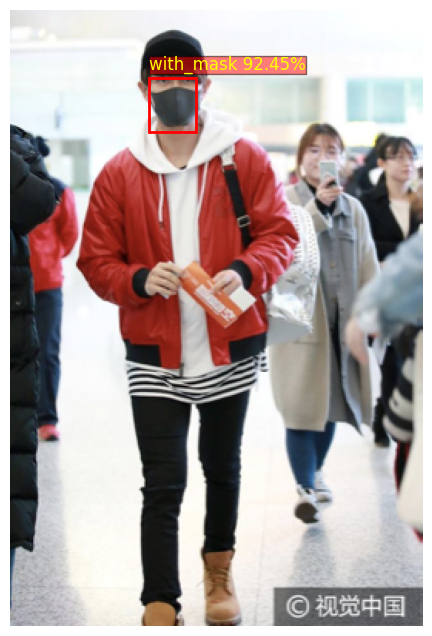

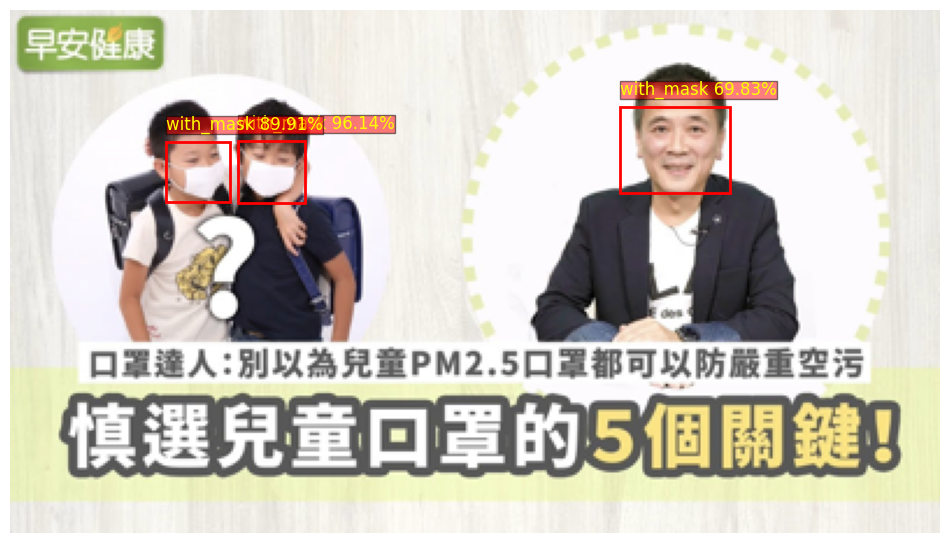

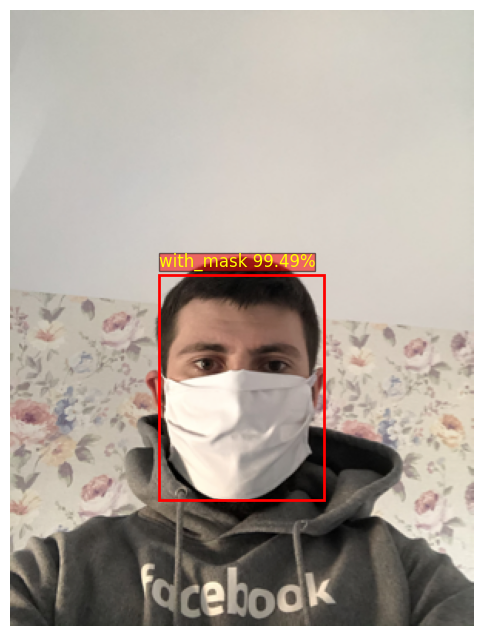

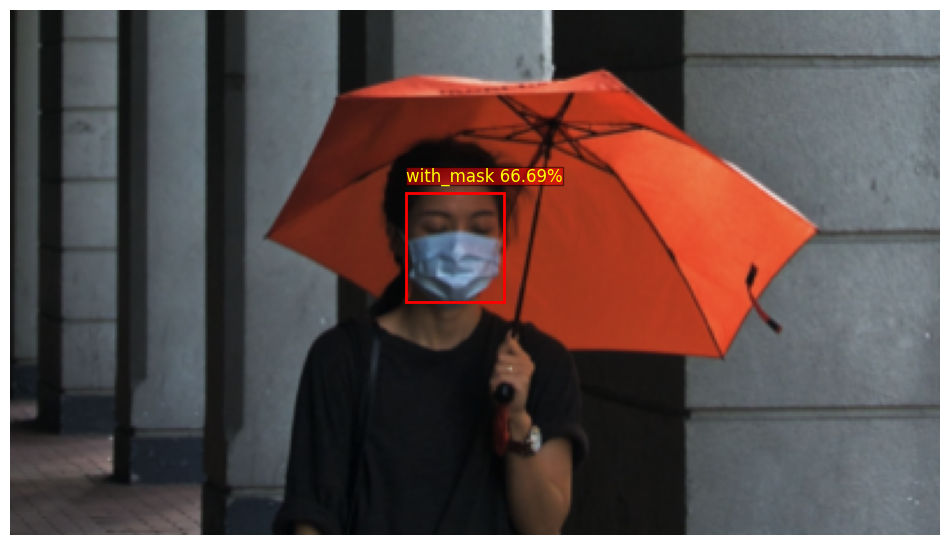

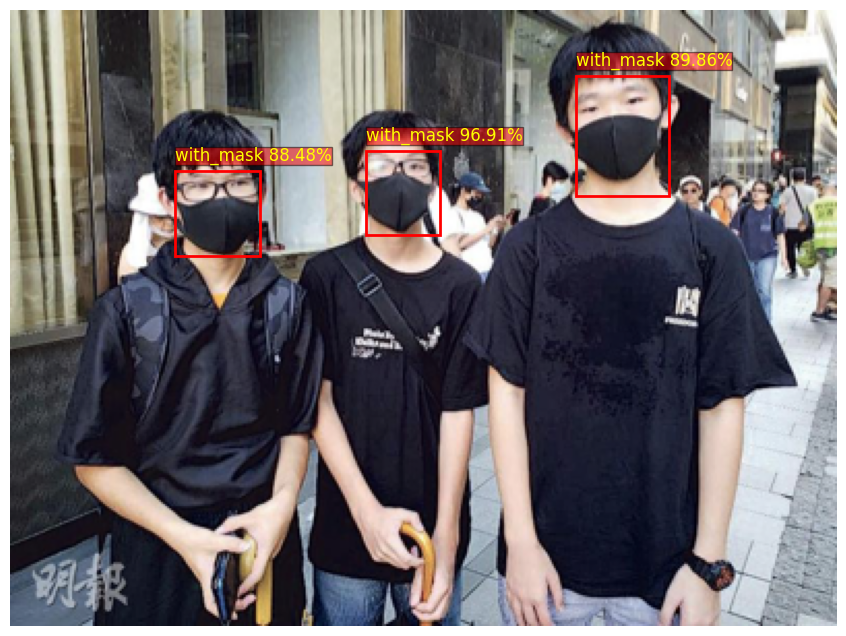

...

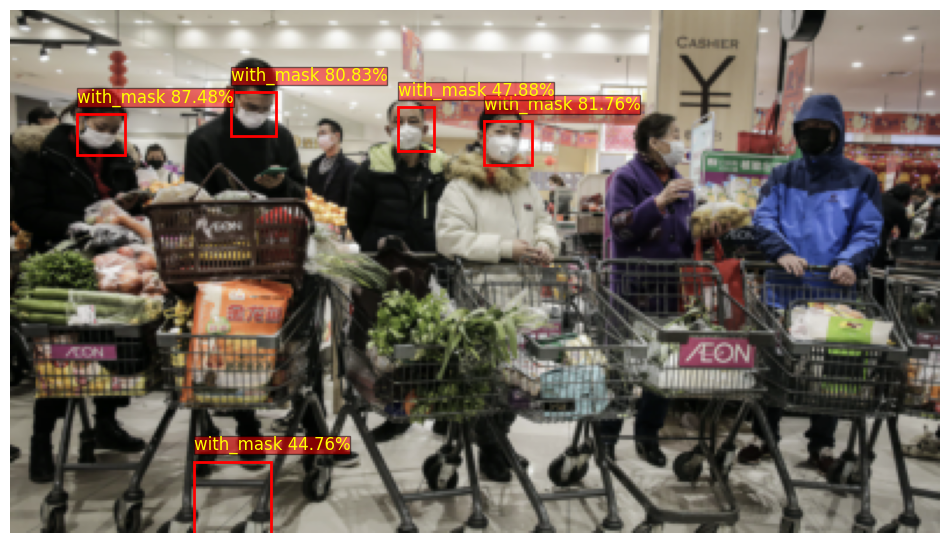

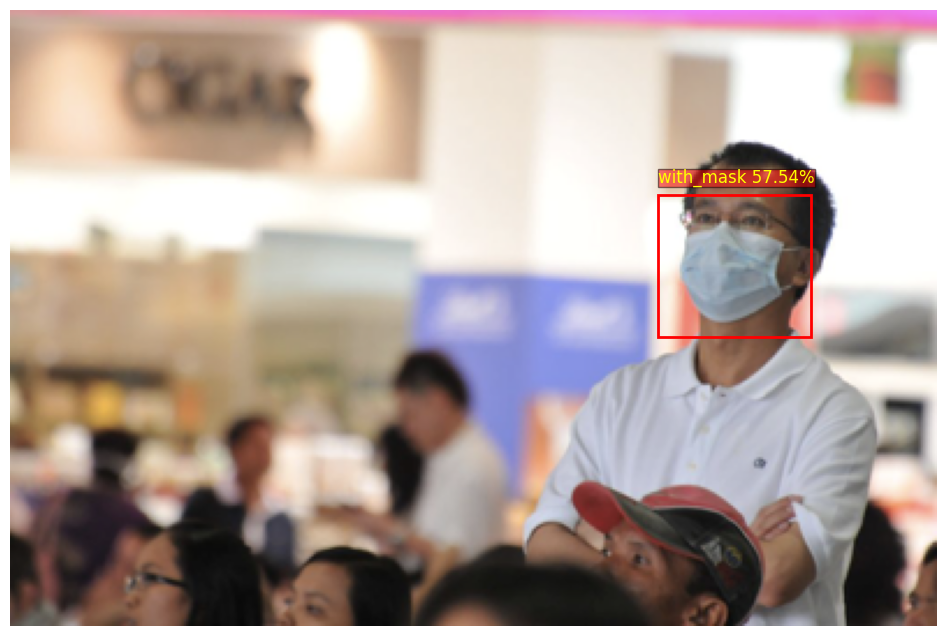

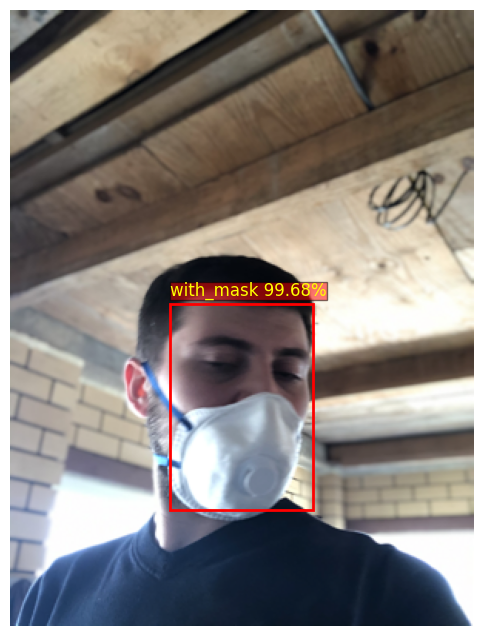

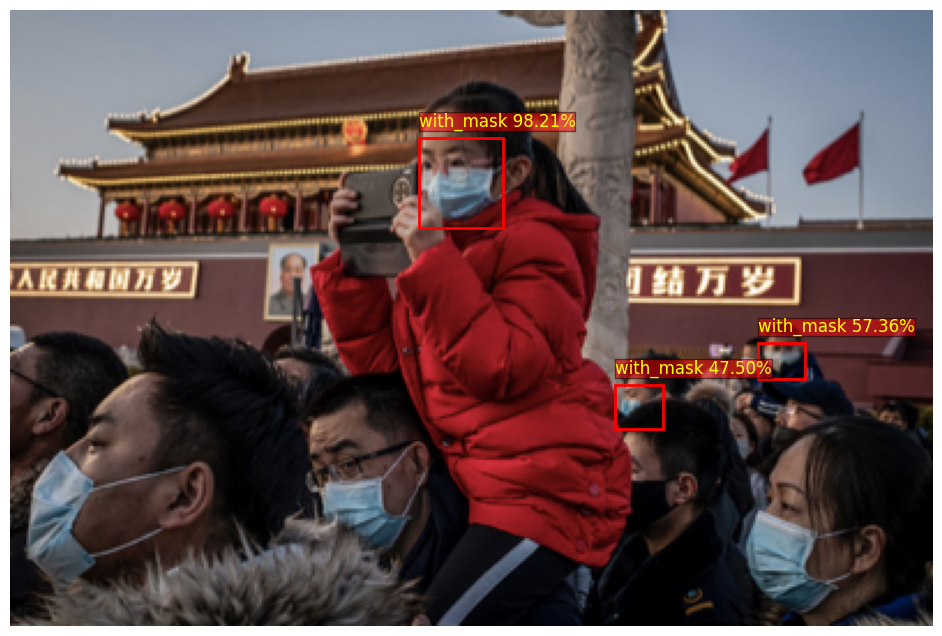

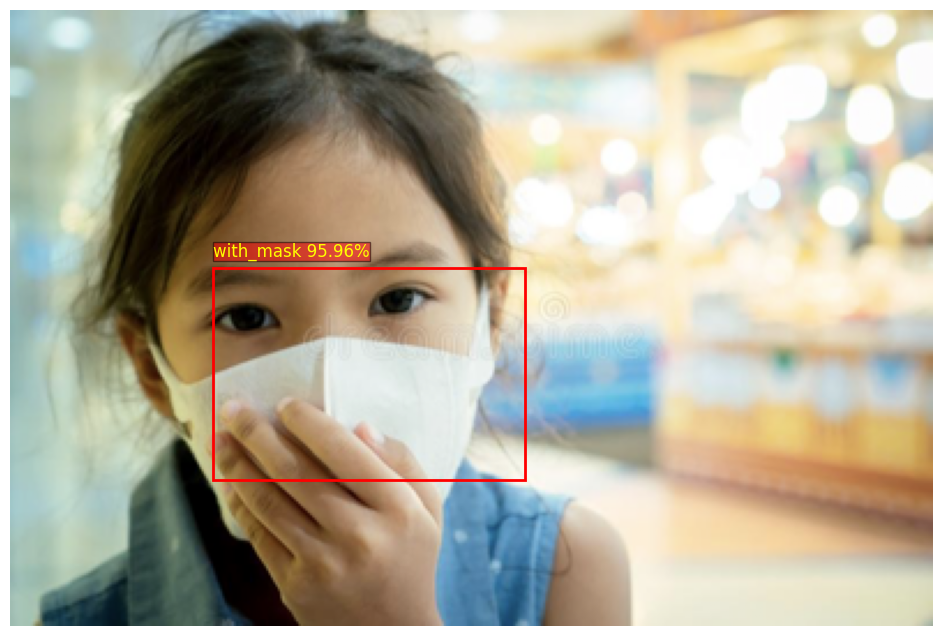

In [8]:
from torchvision import transforms
device = "cpu"
num_classes = 4
backbone_weights = VGG16_Weights.IMAGENET1K_V1
model = ssd300_vgg16(
    weights=None,
    weights_backbone=backbone_weights,
    num_classes=num_classes
)

model.load_state_dict(torch.load("../models/ssd300_finetune.pth", map_location=device))
model.to(device)

img_file = sorted(glob(f"../data/valid/images/*.png"))
img_file
for file in img_file[20:40]:
    inference(file, model, device, 0.4)

In [ ]:
!pip install torchmetrics

In [12]:
import torch
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torchvision.ops import box_iou
torch.cuda.empty_cache()
import gc
gc.collect()

def evaluate_detection(model, dataloader, device, score_thresh=0.5, iou_thresh=0.5, class_names=None):
    model.eval()
    metric = MeanAveragePrecision(iou_type="bbox")

    all_precisions, all_recalls, all_f1s = [], [], []
    all_ious = []

    for images, targets in dataloader:
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k,v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images)

        # Update TorchMetrics mAP
        metric.update(outputs, targets)

        # Tính IoU trung bình + Precision/Recall/F1 batch
        for output, target in zip(outputs, targets):
            pred_boxes = output['boxes']
            pred_scores = output['scores']
            pred_labels = output['labels']
            keep = pred_scores >= score_thresh
            pred_boxes = pred_boxes[keep]
            pred_labels = pred_labels[keep]

            gt_boxes = target['boxes']
            gt_labels = target['labels']

            ious = box_iou(pred_boxes, gt_boxes)
            if ious.numel() > 0:
                max_iou_per_pred, _ = ious.max(dim=1)
                all_ious.extend(max_iou_per_pred.cpu().numpy())

            TP = ((ious >= iou_thresh).sum(dim=1) > 0).sum().item()
            FP = len(pred_boxes) - TP
            FN = len(gt_boxes) - ((ious >= iou_thresh).sum(dim=0) > 0).sum().item()

            precision = TP / (TP + FP + 1e-6)
            recall = TP / (TP + FN + 1e-6)
            f1 = 2 * precision * recall / (precision + recall + 1e-6)

            all_precisions.append(precision)
            all_recalls.append(recall)
            all_f1s.append(f1)

    results = metric.compute()  # mAP từ TorchMetrics
    avg_iou = sum(all_ious) / len(all_ious) if all_ious else 0
    avg_precision = sum(all_precisions)/len(all_precisions) if all_precisions else 0
    avg_recall = sum(all_recalls)/len(all_recalls) if all_recalls else 0
    avg_f1 = sum(all_f1s)/len(all_f1s) if all_f1s else 0

    final_results = {
        "mAP": results['map'].item(),
        "mAP_50": results['map_50'].item(),
        "mAP_75": results['map_75'].item(),
        "IoU_mean": avg_iou,
        "Precision": avg_precision,
        "Recall": avg_recall,
        "F1": avg_f1
    }

    return final_results

dataset_dict, dataloader_dict, model = get_dataloaders(
    root="../data",
    classes=["background", "with_mask", "without_mask", "mask_weared_incorrect"],
    batch_size=16,
    num_worker=0,
    device=device,
    freeze_backbone=False
)
eval = evaluate_detection(model, 
                          dataloader_dict['valid'], 
                          device, 
                          score_thresh=0.5, 
                          iou_thresh=0.5, 
                          class_names=["background", "with_mask", "without_mask", "mask_weared_incorrect"])

print(eval)


d:\miniconda3\envs\cv-env\lib\site-packages\torchmetrics\utilities\prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)  # noqa: B028


{'mAP': 3.17095498303388e-07, 'mAP_50': 6.34190996606776e-07, 'mAP_75': 0.0, 'IoU_mean': 0.0037846068625497927, 'Precision': 2.9239765935672514e-05, 'Recall': 0.005847947368426901, 'F1': 5.818853073957031e-05}
